<a href="https://colab.research.google.com/github/y-lims/DADS7202_Potato/blob/main/Inference_PR.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Import Lib

In [ ]:
import sys
print( f"Python {sys.version}\n" )

import numpy as np
print( f"NumPy {np.__version__}\n" )

import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline
print( f"Matplotlib {matplotlib.__version__}\n" )

import tensorflow as tf
print( f"TensorFlow {tf.__version__}" )
print( f"tf.keras.backend.image_data_format() = {tf.keras.backend.image_data_format()}" )

# Count the number of GPUs as detected by tensorflow
gpus = tf.config.list_physical_devices('GPU')
print( f"TensorFlow detected { len(gpus) } GPU(s):" )
for i, gpu in enumerate(gpus):
  print( f".... GPU No. {i}: Name = {gpu.name} , Type = {gpu.device_type}" )

# from keras.preprocessing.image import ImageDataGenerator
from tensorflow import keras

import os
import sys
import numpy as np
import pandas as pd
import random as rn
import sklearn
import tensorflow as tf
from sklearn.metrics import confusion_matrix
from tensorflow import keras
# from keras.preprocessing.image import ImageDataGenerator
from IPython.display import Image, display
import matplotlib.cm as cmp
import matplotlib.pyplot as plt
import seaborn as sns
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.applications.vgg16 import preprocess_input
from sklearn.model_selection import train_test_split

import os
import numpy as np
import tensorflow as tf

import seaborn as sns
import numpy as np
from sklearn.metrics import confusion_matrix, accuracy_score, recall_score, precision_score, f1_score
import matplotlib.pyplot as plt



Python 3.10.12 (main, Jul 29 2024, 16:56:48) [GCC 11.4.0]

NumPy 1.26.4

Matplotlib 3.7.1

TensorFlow 2.17.0
tf.keras.backend.image_data_format() = channels_last
TensorFlow detected 1 GPU(s):
.... GPU No. 0: Name = /physical_device:GPU:0 , Type = GPU


In [ ]:
# Define a flag to check if running on Colab
on_colab = 'google.colab' in str(get_ipython())

if on_colab:
    from google.colab import drive
    drive.mount('/content/drive')
    base_path = '/content/drive/My Drive/Final_Potato'
else:
    base_path = 'D:/anaconda3/envs/tfv1/00_deep_prj/Final_Potato'


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Load Data

## Train set

==== Healthy ====
Shape of x (Healthy): (305, 224, 224, 3)
Shape of y (Healthy): (305,)
latest index :  304


array([[[ 62,  56,  32],
        [ 63,  57,  33],
        [ 66,  60,  36],
        ...,
        [ 88,  70,  48],
        [ 86,  68,  46],
        [ 85,  67,  45]],

       [[ 66,  60,  36],
        [ 67,  61,  37],
        [ 69,  63,  39],
        ...,
        [ 88,  70,  48],
        [ 87,  69,  47],
        [ 86,  68,  46]],

       [[ 70,  64,  40],
        [ 71,  65,  41],
        [ 72,  66,  42],
        ...,
        [ 89,  71,  49],
        [ 88,  70,  48],
        [ 87,  69,  47]],

       ...,

       [[ 89,  63,  46],
        [ 90,  64,  47],
        [ 92,  66,  49],
        ...,
        [127, 101,  76],
        [126, 100,  75],
        [125,  99,  74]],

       [[ 88,  62,  45],
        [ 89,  63,  46],
        [ 91,  65,  48],
        ...,
        [126, 100,  75],
        [125,  99,  74],
        [124,  98,  73]],

       [[ 88,  62,  45],
        [ 89,  63,  46],
        [ 91,  65,  48],
        ...,
        [126, 100,  75],
        [124,  98,  73],
        [124,  98,  73]]], dtype=uint8)
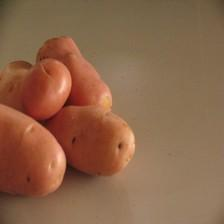

==== Blackleg ====
Shape of x (Blackleg): (60, 224, 224, 3)
Shape of y (Blackleg): (60,)
latest index :  364


array([[[230, 237, 243],
        [230, 237, 243],
        [231, 238, 244],
        ...,
        [220, 225, 231],
        [219, 224, 230],
        [219, 224, 230]],

       [[230, 237, 243],
        [230, 237, 243],
        [231, 238, 244],
        ...,
        [219, 224, 230],
        [219, 224, 230],
        [220, 225, 231]],

       [[231, 238, 244],
        [231, 238, 244],
        [232, 239, 245],
        ...,
        [218, 223, 229],
        [219, 224, 230],
        [220, 225, 231]],

       ...,

       [[235, 240, 244],
        [235, 240, 244],
        [236, 241, 245],
        ...,
        [216, 219, 226],
        [216, 219, 226],
        [216, 219, 226]],

       [[235, 240, 244],
        [235, 240, 244],
        [236, 241, 245],
        ...,
        [216, 219, 226],
        [216, 219, 226],
        [216, 219, 226]],

       [[235, 240, 244],
        [235, 240, 244],
        [236, 241, 245],
        ...,
        [215, 218, 225],
        [215, 218, 225],
        [215, 218, 225]]], dtype=uint8)
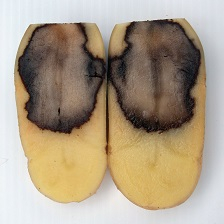


==== Black Scurf ====
Shape of x (Black Scurf): (58, 224, 224, 3)
Shape of y (Black Scurf): (58,)
latest index :  422


array([[[254, 254, 254],
        [254, 254, 254],
        [254, 254, 254],
        ...,
        [254, 254, 254],
        [254, 254, 254],
        [254, 254, 254]],

       [[254, 254, 254],
        [254, 254, 254],
        [254, 254, 254],
        ...,
        [254, 254, 254],
        [254, 254, 254],
        [254, 254, 254]],

       [[254, 254, 254],
        [254, 254, 254],
        [254, 254, 254],
        ...,
        [254, 254, 254],
        [254, 254, 254],
        [254, 254, 254]],

       ...,

       [[254, 254, 254],
        [254, 254, 254],
        [254, 254, 254],
        ...,
        [254, 254, 254],
        [254, 254, 254],
        [254, 254, 254]],

       [[254, 254, 254],
        [254, 254, 254],
        [254, 254, 254],
        ...,
        [254, 254, 254],
        [254, 254, 254],
        [254, 254, 254]],

       [[254, 254, 254],
        [254, 254, 254],
        [254, 254, 254],
        ...,
        [254, 254, 254],
        [254, 254, 254],
        [254, 254, 254]]], dtype=uint8)
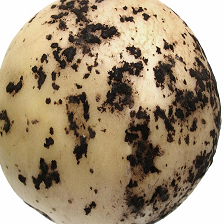


==== Pink Rot ====
Shape of x (Pink Rot): (57, 224, 224, 3)
Shape of y (Pink Rot): (57,)
latest index :  479


array([[[11, 11, 11],
        [12, 12, 12],
        [13, 13, 13],
        ...,
        [11, 11, 11],
        [13, 13, 13],
        [12, 12, 12]],

       [[11, 11, 11],
        [12, 12, 12],
        [13, 13, 13],
        ...,
        [11, 11, 11],
        [13, 13, 13],
        [12, 12, 12]],

       [[11, 11, 11],
        [12, 12, 12],
        [13, 13, 13],
        ...,
        [11, 11, 11],
        [13, 13, 13],
        [12, 12, 12]],

       ...,

       [[14, 14, 14],
        [15, 15, 15],
        [15, 15, 15],
        ...,
        [13, 13, 13],
        [12, 12, 12],
        [13, 13, 13]],

       [[15, 15, 15],
        [16, 16, 16],
        [16, 16, 16],
        ...,
        [14, 14, 14],
        [13, 13, 13],
        [16, 16, 16]],

       [[15, 15, 15],
        [16, 16, 16],
        [16, 16, 16],
        ...,
        [14, 14, 14],
        [13, 13, 13],
        [16, 16, 16]]], dtype=uint8)
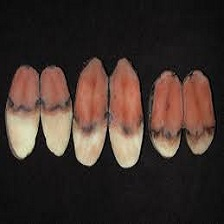


==== Common Scab ====
Shape of x (Common Scab): (62, 224, 224, 3)
Shape of y (Common Scab): (62,)
latest index :  541


array([[[ 92,  72,  47],
        [ 90,  70,  45],
        [ 89,  69,  44],
        ...,
        [136,  69,  50],
        [133,  66,  49],
        [130,  63,  46]],

       [[ 84,  64,  39],
        [ 82,  62,  37],
        [ 80,  60,  35],
        ...,
        [129,  67,  46],
        [128,  65,  47],
        [128,  65,  47]],

       [[ 81,  61,  36],
        [ 78,  58,  33],
        [ 77,  57,  33],
        ...,
        [127,  71,  48],
        [127,  70,  50],
        [129,  72,  52]],

       ...,

       [[ 46,  82, 130],
        [ 46,  84, 129],
        [ 46,  85, 128],
        ...,
        [193, 133,  63],
        [196, 136,  66],
        [203, 144,  74]],

       [[ 46,  84, 133],
        [ 44,  85, 131],
        [ 43,  84, 128],
        ...,
        [191, 130,  67],
        [186, 126,  63],
        [191, 133,  69]],

       [[ 43,  83, 134],
        [ 42,  82, 131],
        [ 41,  82, 126],
        ...,
        [191, 131,  69],
        [182, 122,  60],
        [183, 125,  62]]], dtype=uint8)
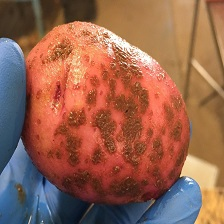


==== Dry Rot ====
Shape of x (Dry Rot): (60, 224, 224, 3)
Shape of y (Dry Rot): (60,)
latest index :  601


array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [240, 249, 248],
        [240, 249, 248],
        [240, 249, 248]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [240, 249, 248],
        [240, 249, 248],
        [240, 249, 248]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [240, 249, 248],
        [240, 249, 248],
        [241, 250, 249]]], dtype=uint8)
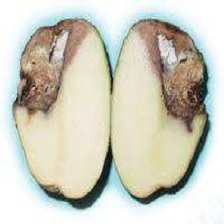

In [ ]:
allowed_extensions = (".JPG", ".jpg", ".jpeg", ".JPEG", ".PNG", ".png")
# class_mapping = {'Healthy': 0, 'Blackleg': 1, 'Black Scurf': 1, 'Pink Rot': 1, 'Common Scab': 1, 'Dry Rot': 1}
class_mapping = {'Healthy': 0, 'Blackleg': 1, 'Black Scurf': 2, 'Pink Rot': 3, 'Common Scab': 4, 'Dry Rot': 5}

def process_dataset_nosplit(folder_path, class_name):

    print(f'==== {class_name} ====')
    x, y, z = [], [], []
    for filename in os.listdir(os.path.join(folder_path, class_name)):
        if filename.endswith(allowed_extensions):
            file_path = os.path.join(folder_path, class_name, filename)
            img = tf.keras.preprocessing.image.load_img(file_path, target_size=(224, 224))
            img_array = tf.keras.preprocessing.image.img_to_array(img).astype(np.uint8)
            x.append(img_array)
            y.append(class_mapping[class_name])
            z.append([class_name, filename])


    x = np.array(x)
    y = np.array(y).reshape(-1,)
    print(f"Shape of x ({class_name}):", x.shape)
    print(f"Shape of y ({class_name}):", y.shape)
    return x, y, z

# ==========================================================================================

folder_path = '/content/drive/My Drive/Final_Potato/train_data/archive/'
x, y, z = process_dataset_nosplit(folder_path, 'Healthy')
x_combined, y_combined, z_combined = x, y, z
print('latest index : ', len(x_combined) - 1)
display(x[0])

check_ind = [len(x_combined) - 1]
check_class = ['Healthy']
for i in list(class_mapping.keys())[1:]:
    x, y, z = process_dataset_nosplit(folder_path, i)
    x_combined = np.concatenate((x_combined, x), axis=0)
    y_combined = np.concatenate((y_combined, y), axis=0)
    z_combined = np.concatenate((z_combined, z), axis=0)
    print('latest index : ', len(x_combined) - 1)
    display(x[0])
    print()
    check_ind.append(len(x_combined) - 1)
    check_class.append(i)

x_train, y_train = x_combined, y_combined



## Test set

==== Healthy ====
Shape of x (Healthy): (307, 224, 224, 3)
Shape of y (Healthy): (307,)
latest index :  306


array([[[220, 221, 216],
        [218, 219, 214],
        [207, 208, 203],
        ...,
        [200, 201, 195],
        [201, 202, 196],
        [201, 202, 196]],

       [[215, 216, 211],
        [211, 212, 207],
        [220, 221, 216],
        ...,
        [198, 199, 193],
        [201, 202, 196],
        [201, 202, 196]],

       [[219, 220, 215],
        [210, 211, 206],
        [216, 217, 212],
        ...,
        [202, 203, 197],
        [201, 202, 196],
        [202, 203, 197]],

       ...,

       [[203, 204, 198],
        [203, 204, 198],
        [203, 204, 198],
        ...,
        [195, 196, 190],
        [196, 197, 191],
        [197, 198, 192]],

       [[202, 203, 197],
        [204, 205, 199],
        [204, 205, 199],
        ...,
        [195, 196, 190],
        [195, 196, 190],
        [195, 196, 190]],

       [[201, 202, 196],
        [204, 205, 199],
        [204, 205, 199],
        ...,
        [195, 196, 190],
        [192, 193, 187],
        [194, 195, 189]]], dtype=uint8)
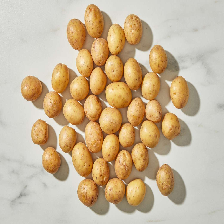

==== Blackleg ====
Shape of x (Blackleg): (60, 224, 224, 3)
Shape of y (Blackleg): (60,)
latest index :  366


array([[[182, 176, 180],
        [183, 177, 181],
        [183, 177, 181],
        ...,
        [165, 170, 166],
        [165, 170, 166],
        [166, 171, 167]],

       [[181, 175, 179],
        [184, 178, 182],
        [184, 178, 182],
        ...,
        [164, 169, 165],
        [164, 169, 165],
        [164, 169, 165]],

       [[180, 174, 178],
        [184, 178, 182],
        [184, 178, 182],
        ...,
        [165, 167, 164],
        [165, 167, 164],
        [165, 167, 164]],

       ...,

       [[194, 195, 213],
        [195, 196, 214],
        [195, 196, 214],
        ...,
        [190, 198, 211],
        [190, 198, 211],
        [194, 202, 215]],

       [[191, 192, 212],
        [192, 193, 213],
        [192, 193, 213],
        ...,
        [187, 195, 208],
        [187, 195, 208],
        [189, 197, 210]],

       [[199, 200, 221],
        [188, 189, 210],
        [188, 189, 210],
        ...,
        [189, 197, 210],
        [189, 197, 210],
        [188, 196, 209]]], dtype=uint8)
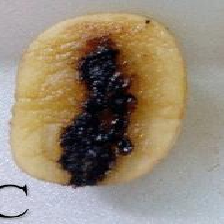


==== Black Scurf ====
Shape of x (Black Scurf): (66, 224, 224, 3)
Shape of y (Black Scurf): (66,)
latest index :  432


array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]]], dtype=uint8)
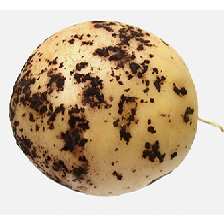


==== Pink Rot ====
Shape of x (Pink Rot): (51, 224, 224, 3)
Shape of y (Pink Rot): (51,)
latest index :  483


array([[[ 8,  8,  8],
        [ 6,  6,  6],
        [14, 14, 14],
        ...,
        [ 1,  1,  1],
        [ 1,  1,  1],
        [ 1,  1,  1]],

       [[ 9,  9,  9],
        [ 8,  8,  8],
        [ 8,  8,  8],
        ...,
        [ 1,  1,  1],
        [ 1,  1,  1],
        [ 1,  1,  1]],

       [[ 5,  5,  5],
        [ 6,  6,  6],
        [ 4,  4,  4],
        ...,
        [ 1,  1,  1],
        [ 1,  1,  1],
        [ 1,  1,  1]],

       ...,

       [[ 3,  3,  3],
        [ 4,  4,  4],
        [ 4,  4,  4],
        ...,
        [ 5,  5,  5],
        [ 5,  5,  5],
        [ 5,  5,  5]],

       [[ 8,  8,  8],
        [ 7,  7,  7],
        [ 8,  8,  8],
        ...,
        [ 2,  2,  2],
        [ 2,  2,  2],
        [ 2,  2,  2]],

       [[66, 66, 66],
        [65, 65, 65],
        [66, 66, 66],
        ...,
        [65, 65, 65],
        [65, 65, 65],
        [65, 65, 65]]], dtype=uint8)
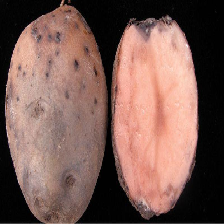


==== Common Scab ====
Shape of x (Common Scab): (60, 224, 224, 3)
Shape of y (Common Scab): (60,)
latest index :  543


array([[[15, 14, 10],
        [16, 15, 11],
        [17, 16, 12],
        ...,
        [15, 14, 10],
        [15, 14, 10],
        [15, 14, 10]],

       [[16, 15, 11],
        [16, 15, 11],
        [16, 15, 11],
        ...,
        [15, 14, 10],
        [15, 14, 10],
        [14, 13,  9]],

       [[17, 16, 12],
        [16, 15, 11],
        [15, 14, 10],
        ...,
        [15, 14, 10],
        [15, 14, 10],
        [16, 15, 11]],

       ...,

       [[20, 16, 13],
        [18, 14, 11],
        [16, 12,  9],
        ...,
        [15, 14, 10],
        [15, 14, 10],
        [15, 14, 10]],

       [[18, 14, 11],
        [18, 14, 11],
        [18, 14, 11],
        ...,
        [13, 12,  8],
        [17, 16, 12],
        [19, 18, 14]],

       [[18, 14, 11],
        [17, 13, 10],
        [19, 15, 12],
        ...,
        [14, 13,  9],
        [14, 13,  9],
        [15, 14, 10]]], dtype=uint8)
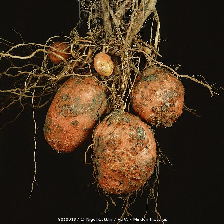


==== Dry Rot ====
Shape of x (Dry Rot): (51, 224, 224, 3)
Shape of y (Dry Rot): (51,)
latest index :  594


array([[[234, 236, 235],
        [234, 236, 235],
        [234, 236, 235],
        ...,
        [242, 244, 243],
        [242, 244, 243],
        [242, 244, 243]],

       [[234, 236, 235],
        [234, 236, 235],
        [234, 236, 235],
        ...,
        [242, 244, 243],
        [242, 244, 243],
        [242, 244, 243]],

       [[234, 236, 235],
        [234, 236, 235],
        [234, 236, 235],
        ...,
        [242, 244, 243],
        [242, 244, 243],
        [242, 244, 243]],

       ...,

       [[228, 230, 229],
        [228, 230, 229],
        [228, 230, 229],
        ...,
        [240, 242, 241],
        [240, 242, 241],
        [240, 242, 241]],

       [[228, 230, 229],
        [228, 230, 229],
        [228, 230, 229],
        ...,
        [240, 242, 241],
        [240, 242, 241],
        [240, 242, 241]],

       [[228, 230, 229],
        [228, 230, 229],
        [228, 230, 229],
        ...,
        [240, 242, 241],
        [240, 242, 241],
        [240, 242, 241]]], dtype=uint8)
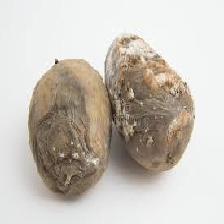

In [ ]:
# ==========================================================================================

folder_path = '/content/drive/My Drive/Final_Potato/test_data/'
x, y, z = process_dataset_nosplit(folder_path, 'Healthy')
x_combined, y_combined, z_combined = x, y, z
print('latest index : ', len(x_combined) - 1)
display(x[0])

check_ind = [len(x_combined) - 1]
check_class = ['Healthy']
for i in list(class_mapping.keys())[1:]:
    x, y, z = process_dataset_nosplit(folder_path, i)
    x_combined = np.concatenate((x_combined, x), axis=0)
    y_combined = np.concatenate((y_combined, y), axis=0)
    z_combined = np.concatenate((z_combined, z), axis=0)
    print('latest index : ', len(x_combined) - 1)
    display(x[0])
    print()
    check_ind.append(len(x_combined) - 1)
    check_class.append(i)

x_test, y_test = x_combined, y_combined


# ⏩ Classification

## Preprocess Data

In [ ]:
# Preprocess arttoy dataset to match mobilenet's requirements
x_train_mobilenet = tf.keras.applications.mobilenet.preprocess_input(x_train)
x_test_mobilenet = tf.keras.applications.mobilenet.preprocess_input(x_test)

# from sklearn.utils import shuffle
# x_train_mobilenet_shuffle, y_train_shuffle = shuffle(x_train_mobilenet, y_train, random_state=42)

print( x_train_mobilenet.dtype, x_train_mobilenet.shape, np.min(x_train_mobilenet), np.max(x_train_mobilenet) )
print( x_test_mobilenet.dtype, x_test_mobilenet.shape, np.min(x_test_mobilenet), np.max(x_test_mobilenet) )

float32 (602, 224, 224, 3) -1.0 1.0
float32 (595, 224, 224, 3) -1.0 1.0


## Load Model

In [ ]:
from tensorflow.keras.models import load_model

drive.mount('/content/drive')

best_cls_model_path = '/content/drive/MyDrive/Final_Potato/b_model/cls_mobilenet_v2_123_123_123.keras'
mobilenet_freezeall_model = load_model(best_cls_model_path)
mobilenet_freezeall_model.summary(expand_nested=True)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)           │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ sequential (Sequential)              │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ random_rotation                 │ (10, 224, 224, 3)           │               0 │
│ (RandomRotation)                     │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ random_zoom (RandomZoom)        │ (10, 224, 224, 3)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ mobilenet_1.00_224 (Functional)      │ (None, 7, 7, 1024)          │       3,228,864 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ input_layer (InputLayer)        │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ conv1 (Conv2D)                  │ (None, 112, 112, 32)        │             864 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ conv1_bn (BatchNormalization)   │ (None, 112, 112, 32)        │             128 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ conv1_relu (ReLU)               │ (None, 112, 112, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ conv_dw_1 (DepthwiseConv2D)     │ (None, 112, 112, 32)        │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ conv_dw_1_bn                    │ (None, 112, 112, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ conv_dw_1_relu (ReLU)           │ (None, 112, 112, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ conv_pw_1 (Conv2D)              │ (None, 112, 112, 64)        │           2,048 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ conv_pw_1_bn                    │ (None, 112, 112, 64)        │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ conv_pw_1_relu (ReLU)           │ (None, 112, 112, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ conv_pad_2 (ZeroPadding2D)      │ (None, 113, 113, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ conv_dw_2 (DepthwiseConv2D)     │ (None, 56, 56, 64)          │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ conv_dw_2_bn                    │ (None, 56, 56, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│    └ conv_dw_2_relu (ReLU)           │ (None, 56, 56, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 80,309,972 (306.36 MB)

 Trainable params: 25,693,702 (98.01 MB)

 Non-trainable params: 3,228,864 (12.32 MB)

 Optimizer params: 51,387,406 (196.03 MB)

## Evaluation on Train set

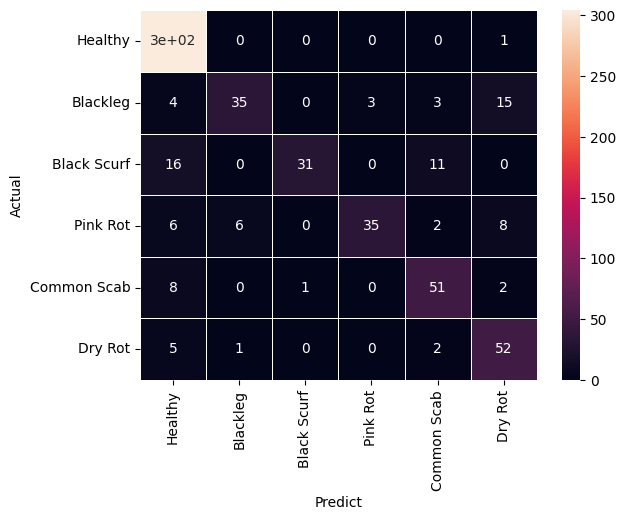

,Accuracy,Recall,Precision
0,0.843854,0.736303,0.835872


Indices of incorrect predictions: [157, 308, 310, 311, 312, 313, 317, 319, 322, 323, 327, 330, 331, 333, 337, 338, 339, 343, 345, 349, 350, 352, 356, 359, 360, 361, 367, 368, 369, 373, 375, 377, 379, 382, 383, 384, 385, 386, 387, 388, 390, 391, 392, 394, 395, 398, 399, 401, 403, 405, 406, 415, 417, 429, 431, 434, 436, 441, 442, 446, 447, 448, 449, 450, 453, 458, 459, 461, 462, 466, 468, 469, 471, 472, 479, 484, 491, 500, 503, 505, 506, 511, 521, 533, 534, 535, 544, 545, 560, 561, 566, 585, 586, 598]


In [ ]:
model = mobilenet_freezeall_model
label = [k for k, v in class_mapping.items()]
x_train_model = x_train_mobilenet

y_pred = []
for i in range(len(x_train_model)):
    x_input = x_train_model[i][np.newaxis, ...]
    y_pred.append(np.argmax(model.predict(x_input, verbose = 0)))

cm = confusion_matrix(y_train, y_pred)

# Plotting the confusion matrix
ax = sns.heatmap(cm, annot=True, xticklabels=label, yticklabels=label, linewidths=.5)
ax.set(xlabel='Predict', ylabel='Actual')
plt.show()

# Calculating and printing accuracy, recall, precision, and f1-score
accuracy = accuracy_score(y_train, y_pred)
recall = recall_score(y_train, y_pred, average='macro')  # Change 'macro' to 'micro' or 'weighted' as needed
precision = precision_score(y_train, y_pred, average='macro')  # Change 'macro' to 'micro' or 'weighted' as needed
f1 = f1_score(y_train, y_pred, average='macro')  # Change 'macro' to 'micro' or 'weighted' as needed

results = {
    'Accuracy': [accuracy],
    'Recall': [recall],
    'Precision': [precision]
}
results_df = pd.DataFrame(results)
display(results_df)

# Extracting indices of wrong predictions
train_incorrect_indices = [i for i, (pred, actual) in enumerate(zip(y_pred, y_train)) if pred != actual]
print("Indices of incorrect predictions:", train_incorrect_indices)

## Evaluation on Test set

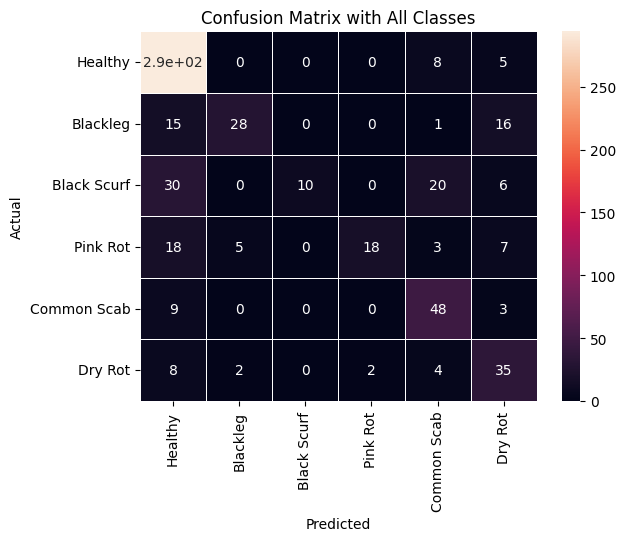

,Accuracy,Recall,Precision,F1-Score
0,0.727731,0.569175,0.757273,0.57648


Indices of incorrect predictions: [36, 74, 75, 76, 79, 101, 111, 112, 114, 115, 118, 176, 296, 309, 310, 314, 317, 318, 321, 322, 323, 325, 326, 329, 334, 336, 337, 338, 339, 342, 343, 344, 345, 346, 351, 352, 353, 355, 356, 357, 358, 361, 363, 364, 366, 369, 370, 371, 372, 375, 376, 377, 378, 379, 380, 383, 386, 387, 388, 389, 390, 391, 392, 393, 394, 395, 397, 398, 399, 400, 401, 402, 403, 404, 405, 406, 407, 408, 409, 410, 411, 412, 413, 414, 415, 416, 417, 418, 419, 420, 422, 423, 424, 425, 426, 427, 428, 429, 430, 431, 432, 434, 435, 437, 438, 442, 444, 445, 446, 447, 448, 449, 452, 455, 456, 457, 459, 460, 461, 462, 463, 464, 466, 467, 468, 471, 473, 475, 476, 479, 480, 481, 482, 483, 485, 495, 497, 502, 512, 518, 519, 520, 527, 530, 534, 538, 544, 545, 546, 559, 562, 563, 564, 568, 569, 573, 575, 576, 578, 579, 584, 592]


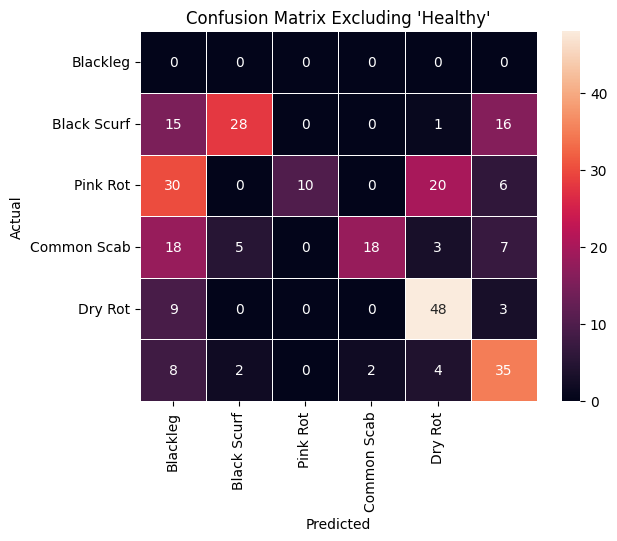

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, accuracy_score, recall_score, precision_score, f1_score

# Assuming x_test_mobilenet and model are defined and loaded
y_pred = []
x_test_model = x_test_mobilenet
reverse_class_mapping = {v: k for k, v in class_mapping.items()}

# Generate predictions
for i in range(len(x_test_model)):
    x_input = x_test_model[i][np.newaxis, ...]
    y_pred.append(np.argmax(model.predict(x_input, verbose=0)))

# Confusion matrix with all classes
cm = confusion_matrix(y_test, y_pred)
labels = [reverse_class_mapping[i] for i in range(len(class_mapping))]

# Plotting the original confusion matrix
ax = sns.heatmap(cm, annot=True, xticklabels=labels, yticklabels=labels, linewidths=.5)
ax.set(xlabel='Predicted', ylabel='Actual')
plt.title('Confusion Matrix with All Classes')
plt.show()

# Calculate overall metrics
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='macro')
precision = precision_score(y_test, y_pred, average='macro')
f1 = f1_score(y_test, y_pred, average='macro')

results = {
    'Accuracy': [accuracy],
    'Recall': [recall],
    'Precision': [precision],
    'F1-Score': [f1]
}
results_df = pd.DataFrame(results)
display(results_df)

# Extracting indices of wrong predictions
test_incorrect_indices = [i for i, (pred, actual) in enumerate(zip(y_pred, y_test)) if pred != actual]
print("Indices of incorrect predictions:", test_incorrect_indices)

# Filter out 'Healthy' class
filter_class = class_mapping['Healthy']
filtered_indices = [i for i, label in enumerate(y_test) if label != filter_class]
y_test_filtered = [y_test[i] for i in filtered_indices]
y_pred_filtered = [y_pred[i] for i in filtered_indices]

# Confusion matrix without 'Healthy' class
cm_filtered = confusion_matrix(y_test_filtered, y_pred_filtered)
labels_filtered = [label for label in labels if label != 'Healthy']

# Plotting the filtered confusion matrix
ax_filtered = sns.heatmap(cm_filtered, annot=True, xticklabels=labels_filtered, yticklabels=labels_filtered, linewidths=.5)
ax_filtered.set(xlabel='Predicted', ylabel='Actual')
plt.title('Confusion Matrix Excluding \'Healthy\'')
plt.show()


## Grad Cam on Test set

## import new image

In [ ]:
import tensorflow as tf
import numpy as np
import cv2
import matplotlib.pyplot as plt
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input

# Define class mapping
class_mapping = {'Healthy': 0, 'Blackleg': 1, 'Black Scurf': 2, 'Pink Rot': 3, 'Common Scab': 4, 'Dry Rot': 5}
reverse_class_mapping = {v: k for k, v in class_mapping.items()}

# Define collected labels as a list for visualization
collected_labels = [k for k, v in class_mapping.items()]

# Load and preprocess the dataset
folder_path = '/content/drive/My Drive/Final_Potato/test_data/'

def process_dataset_nosplit(folder_path, class_name):
    import os
    from tensorflow.keras.preprocessing.image import img_to_array, load_img
    x, y, z = [], [], []
    class_folder = os.path.join(folder_path, class_name)
    for img_name in os.listdir(class_folder):
        img_path = os.path.join(class_folder, img_name)
        img = load_img(img_path, target_size=(224, 224))
        img_array = img_to_array(img)
        x.append(img_array)
        y.append(class_mapping[class_name])
        z.append(img_name)
    return np.array(x), np.array(y), np.array(z)

x, y, z = process_dataset_nosplit(folder_path, 'Healthy')
x_combined, y_combined, z_combined = x, y, z
print('latest index : ', len(x_combined) - 1)

check_ind = [len(x_combined) - 1]
check_class = ['Healthy']
for i in list(class_mapping.keys())[1:]:
    x, y, z = process_dataset_nosplit(folder_path, i)
    x_combined = np.concatenate((x_combined, x), axis=0)
    y_combined = np.concatenate((y_combined, y), axis=0)
    z_combined = np.concatenate((z_combined, z), axis=0)
    print('latest index : ', len(x_combined) - 1)
    check_ind.append(len(x_combined) - 1)
    check_class.append(i)

x_test, y_test = x_combined, y_combined

# Normalize the images to the range 0-1 for model input and 0-255 for display
x_test_display = x_test.copy()
x_test = x_test / 255.0

latest index :  306
latest index :  366
latest index :  432
latest index :  483
latest index :  543
latest index :  594


## Def function and create Model

In [ ]:
# Function to compute Grad-CAM
def compute_gradcam(input_model, image, cls, layer_name):
    last_conv_layer = input_model.get_layer(layer_name)
    last_conv_layer_model = Model(inputs=input_model.inputs, outputs=last_conv_layer.output)

    classifier_input = Input(shape=last_conv_layer.output.shape[1:])
    x = classifier_input
    for layer in input_model.layers[input_model.layers.index(last_conv_layer)+1:]:
        x = layer(x)
    classifier_model = Model(inputs=classifier_input, outputs=x)

    with tf.GradientTape() as tape:
        last_conv_layer_output = last_conv_layer_model(image)
        tape.watch(last_conv_layer_output)
        preds = classifier_model(last_conv_layer_output)
        class_output = preds[:, cls]

    grads = tape.gradient(class_output, last_conv_layer_output)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)

    return heatmap.numpy()

# Load the MobileNet model
mobilenet_model = tf.keras.applications.MobileNet(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Model predictions (use your actual model predictions here)
y_pred = np.random.rand(len(x_test), 6)  # Replace this with the actual model predictions



## Correct Prediction

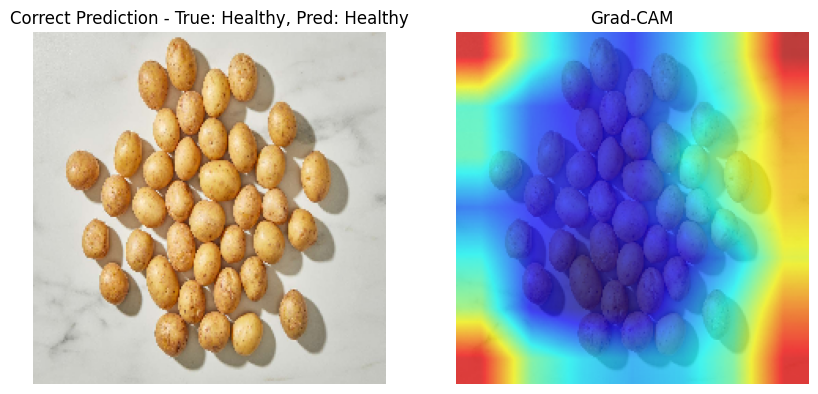

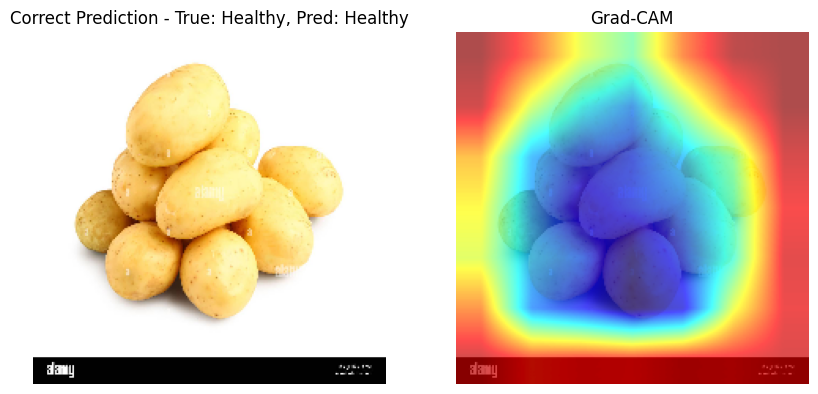

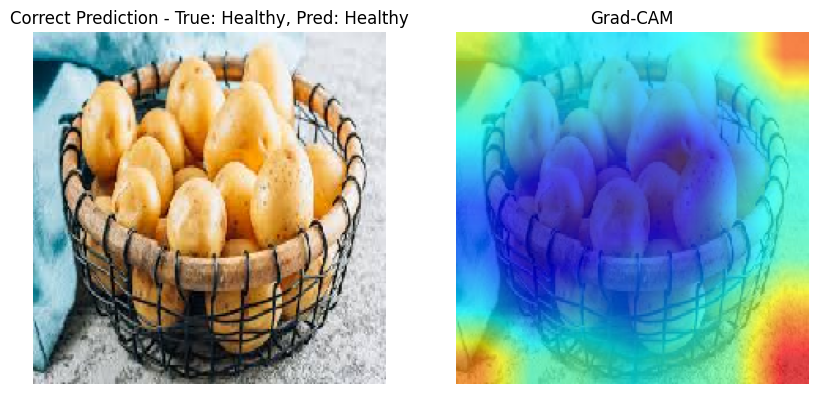

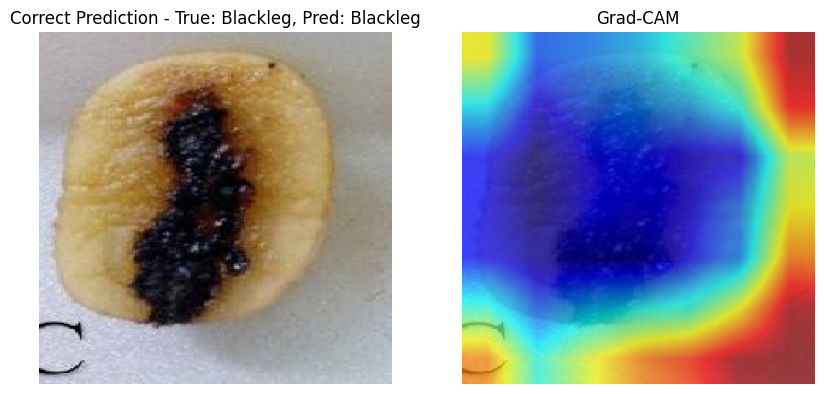

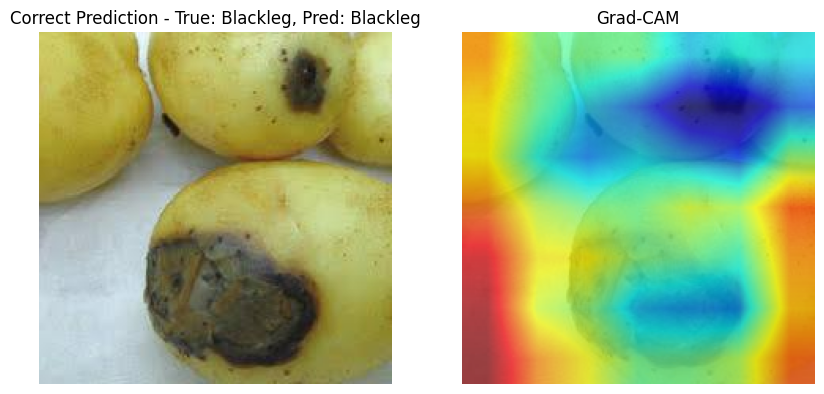

...

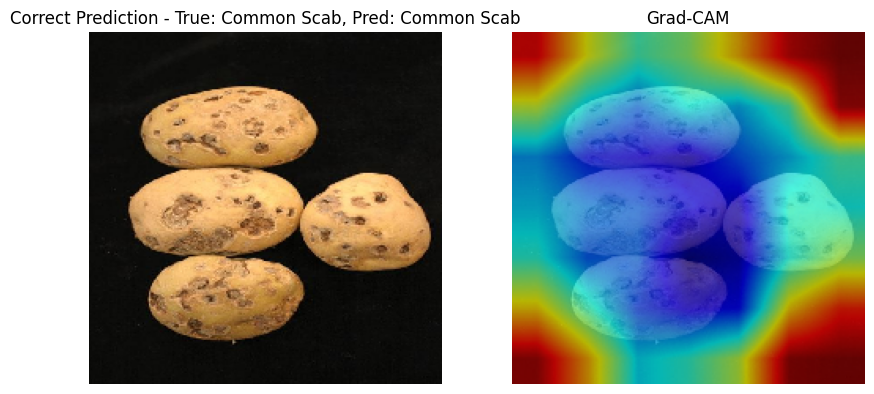

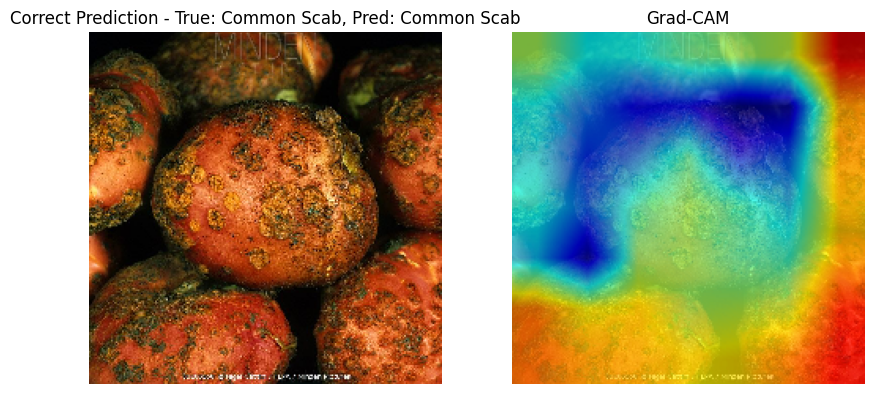

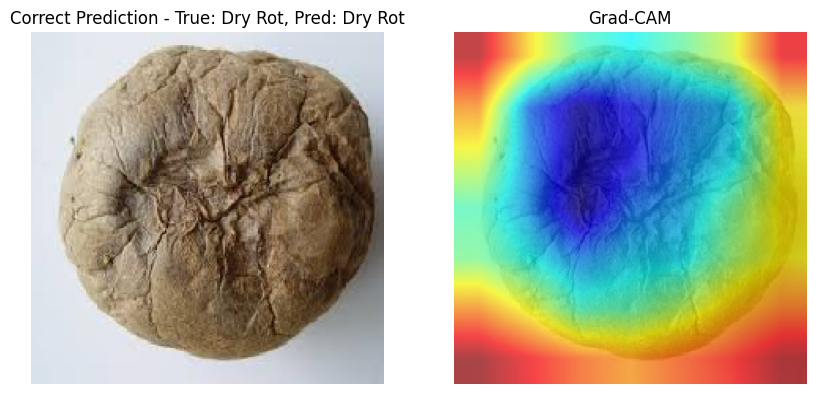

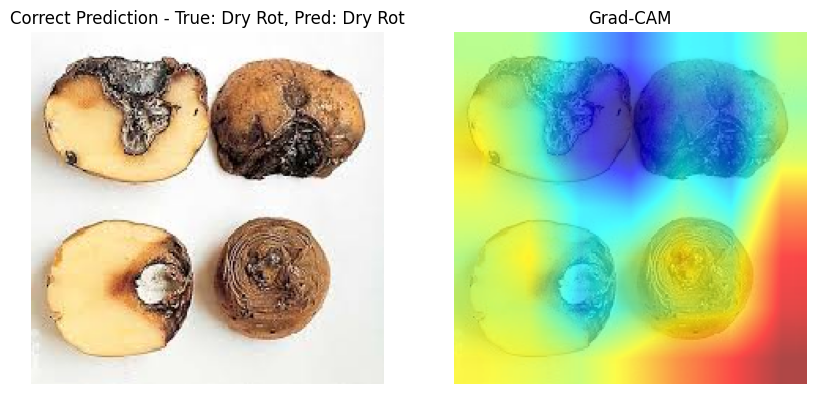

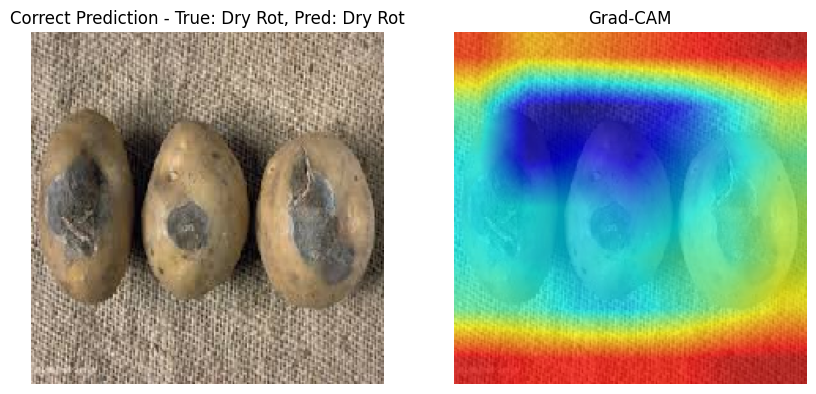

In [ ]:
alpha = 0.7  # Increase alpha value to make heatmap more prominent

for class_idx in range(6):
    class_name = collected_labels[class_idx]
    correct_predictions = []

    for i in range(len(y_test)):
        true_class = y_test[i]
        predicted_class = np.argmax(y_pred[i])
        if true_class == class_idx and true_class == predicted_class:
            correct_predictions.append(i)
        if len(correct_predictions) >= 3:
            break

    for i in correct_predictions:
        image = np.expand_dims(x_test[i], axis=0)
        predicted_class = np.argmax(y_pred[i])
        cam = compute_gradcam(mobilenet_model, image, predicted_class, "conv_pw_13_relu")

        heatmap = np.uint8(255 * cam)
        heatmap = cv2.resize(heatmap, (224, 224))  # Resize to match the input image size
        heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

        img = x_test_display[i].astype(np.uint8)  # Use normalized and uint8 converted image

        # Ensure the sizes match
        if heatmap.shape[:2] != img.shape[:2]:
            heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))

        # Handle grayscale images
        if len(img.shape) == 2 or img.shape[2] == 1:
            img = cv2.cvtColor(img, cv2.COLOR_GRAY2RGB)

        superimposed_img = cv2.addWeighted(img, 1 - alpha, heatmap, alpha, 0)

        fig, axes = plt.subplots(1, 2, figsize=(10, 5))  # Create a figure with 1 row and 2 columns
        axes[0].set_title(f"Correct Prediction - True: {collected_labels[y_test[i]]}, Pred: {collected_labels[predicted_class]}")
        axes[0].imshow(img)
        axes[0].axis('off')

        axes[1].set_title("Grad-CAM")
        axes[1].imshow(superimposed_img)
        axes[1].axis('off')

        plt.show()

## Incorrect Prediction

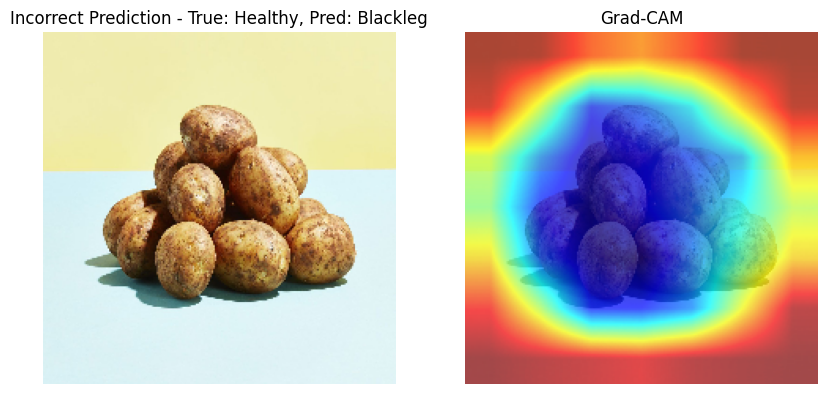

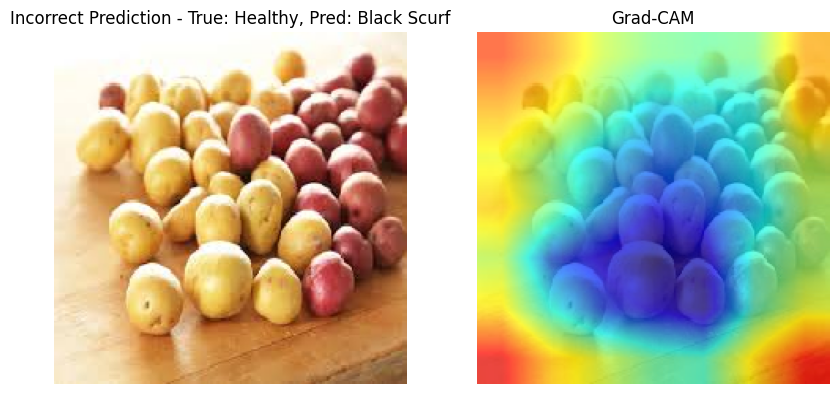

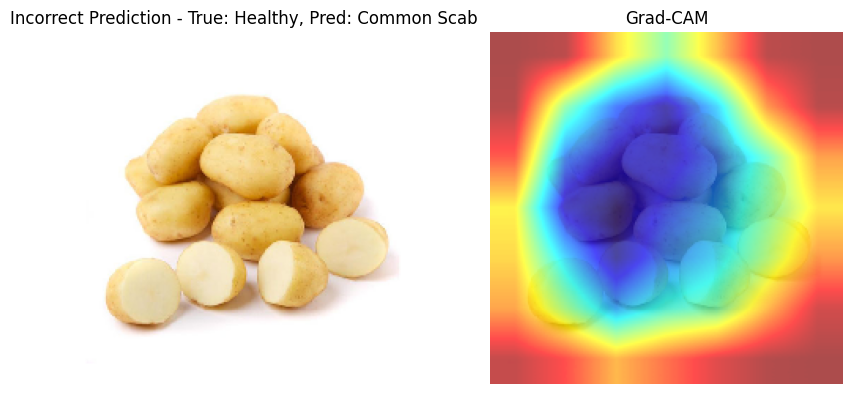

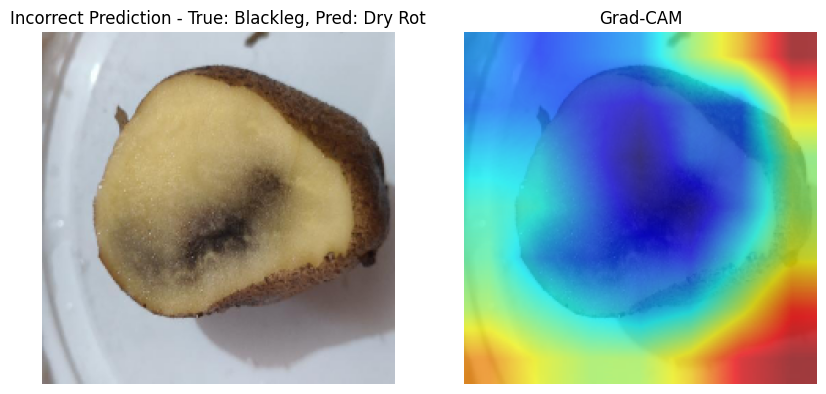

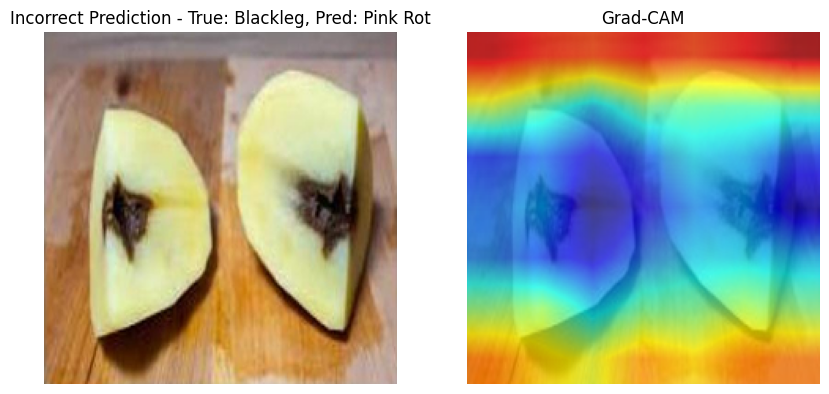

...

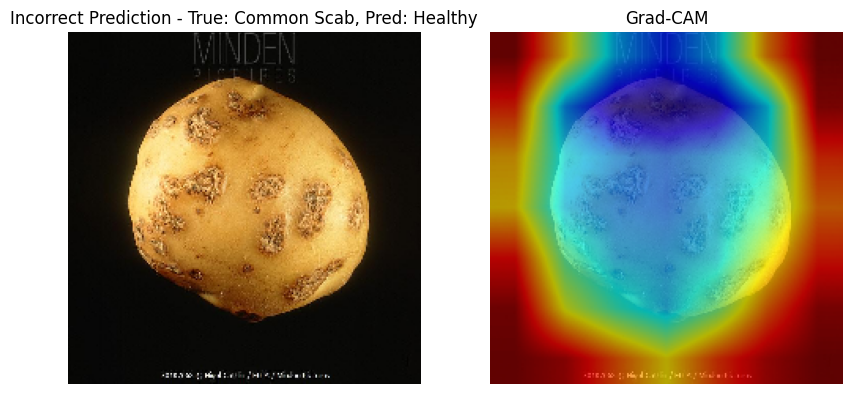

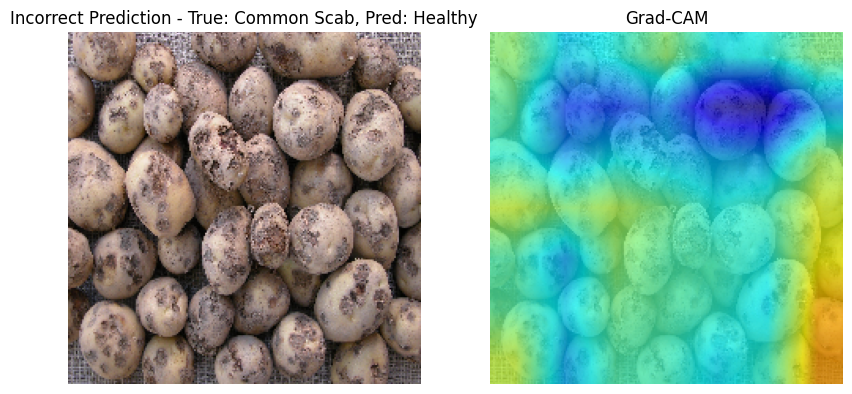

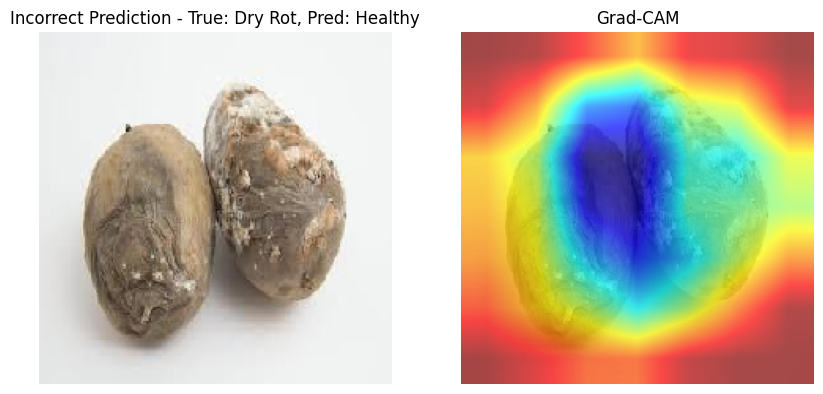

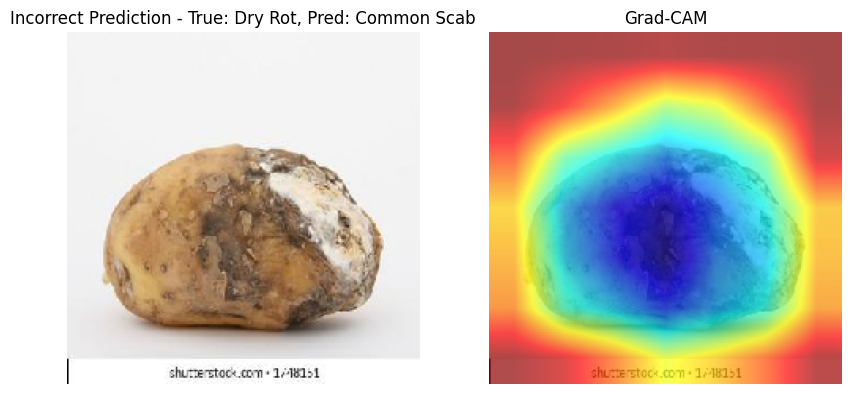

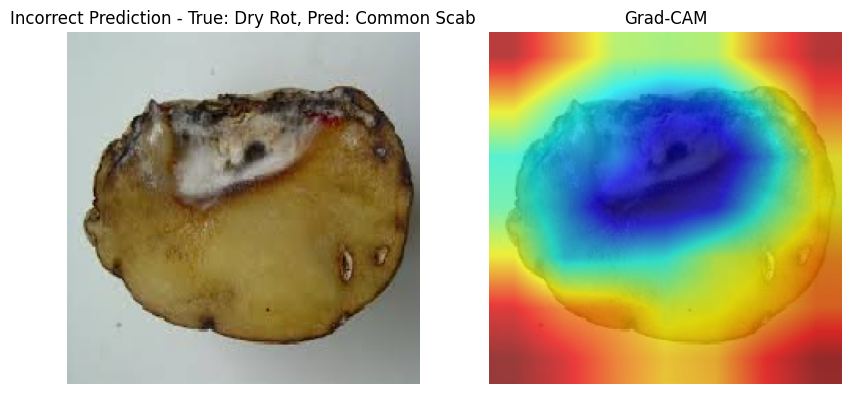

In [ ]:
alpha = 0.7  # Increase alpha value to make heatmap more prominent

for class_idx in range(6):
    class_name = collected_labels[class_idx]
    incorrect_predictions = []

    for i in range(len(y_test)):
        true_class = y_test[i]
        predicted_class = np.argmax(y_pred[i])
        if true_class == class_idx and true_class != predicted_class:
            incorrect_predictions.append(i)
        if len(incorrect_predictions) >= 3:  # Adjust to 3 images per class
            break

    for i in incorrect_predictions:
        image = np.expand_dims(x_test[i], axis=0)
        predicted_class = np.argmax(y_pred[i])
        cam = compute_gradcam(mobilenet_model, image, predicted_class, "conv_pw_13_relu")

        heatmap = np.uint8(255 * cam)
        heatmap = cv2.resize(heatmap, (224, 224))  # Resize to match the input image size
        heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

        img = x_test_display[i].astype(np.uint8)  # Use normalized and uint8 converted image

        # Ensure the sizes match
        if heatmap.shape[:2] != img.shape[:2]:
            heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))

        # Handle grayscale images
        if len(img.shape) == 2 or img.shape[2] == 1:
            img = cv2.cvtolor(img, cv2.COLOR_GRAY2RGB)

        superimposed_img = cv2.addWeighted(img, 1 - alpha, heatmap, alpha, 0)

        fig, axes = plt.subplots(1, 2, figsize=(10, 5))  # Create a figure with 1 row and 2 columns
        axes[0].set_title(f"Incorrect Prediction - True: {collected_labels[y_test[i]]}, Pred: {collected_labels[predicted_class]}")
        axes[0].imshow(img)
        axes[0].axis('off')

        axes[1].set_title("Grad-CAM")
        axes[1].imshow(superimposed_img)
        axes[1].axis('off')

        plt.show()
